In [1]:
#import library
import plotly.offline
from pandas.io.formats.style import Styler
import plotly.graph_objs as go
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
from datetime import date
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")
import ipywidgets as widgets
from IPython.display import display, HTML
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colors
from matplotlib.ticker import FuncFormatter # da se formatira lable u sns heatapi
from IPython.display import display
from pandas_datareader import data as web
import time
import plotly.figure_factory as ff
import plotly.io as pio
pio.renderers.default='notebook'

In [2]:
HTML("<h2><span style='font-family:GT Haptik'> MARKET UPDATE 12.12.2022.</span></h2>")

In [3]:
tickers = list(('EURCHF=X', 'CHF=X', 'EURUSD=X', 'GBPCHF=X', 'CHFJPY=X', 'CHFCNY=X','EURRSD=X',
              'SPI20.SW','^SSMI','^GSPC', '^IXIC', '^FTSE', '^GDAXI', '^FCHI', '^STOXX', '^N225', '000300.SS',
             'GC=F', 'SI=F', 'BTC-USD', 'ETH-USD', 'BZ=F',
               '^SP500-25', '^SP500-30', '^GSPE', '^SP500-40', '^SP500-35', '^SP500-20', '^SP500-45', '^SP500-15', '^SP500-60','^SP500-50',
               '^SP500-55'))

names = list(('EUR/CHF', 'USD/CHF', 'EUR/USD', 'GBP/CHF', 'CHF/JPY', 'CHF/CNY', 'EUR/RSD',
         'SPI20', 'SMI20', 'S&P500', 'NASDAQ100', 'FTSE100', 'DAX30', 'CAC40', 'STOXX600', 'NIKKEI225', 'CSI300',
         'Gold', 'Silver', 'BTC', 'ETH', 'BrentOil',
             'CD', 'CS', 'E', 'F','HC','I','IT', 'M',
             'RE', 'T', 'U'))

#download data form yahoo finance from 2012-10-01 to (today) 2022-10-03
#period='10y

#start = datetime.datetime(2018,1,1)
#end = datetime.datetime(2022,10,1)
data=yf.download(tickers=tickers,interval='1d',period='5y')

#data = web.DataReader(tickers, 'yahoo')

#creating data sets (fx, index, commodities, sectors)

fx_market = data['Close'][['EURCHF=X', 'CHF=X', 'EURUSD=X', 'GBPCHF=X', 'CHFJPY=X', 'CHFCNY=X','EURRSD=X']]
fx_market.columns = names[0:7]

index = data['Close'][['SPI20.SW','^SSMI','^GSPC', '^IXIC', '^FTSE', '^GDAXI', '^FCHI', '^STOXX', '^N225', '000300.SS']]
index.columns = names[7:17]

commodity = data['Close'][['GC=F', 'SI=F', 'BTC-USD', 'ETH-USD', 'BZ=F']]
commodity.columns = names[17:22]

sector = data['Close'][['^SP500-25', '^SP500-30', '^GSPE', '^SP500-40', '^SP500-35', '^SP500-20', '^SP500-45', '^SP500-15', 
                        '^SP500-60','^SP500-50', '^SP500-55']]
sector.columns = names[22:]

#chf
work_days = ['Monday','Tuesday','Wednesday','Thursday','Friday']
chf = yf.download(tickers=['USDCHF=X'],interval='1d',period='5y')
#chf = web.DataReader('USDCHF=X', 'yahoo')
chf = pd.DataFrame(chf['Close'])
chf['day']=chf.index.day_name()
chf = chf[chf.day.isin(work_days)]


#vrednosti u USD

performance = yf.download(tickers=['JPYUSD=X','GC=F','CNYUSD=X', 'EURUSD=X', 'GBPUSD=X;', 
                                   'BTC-USD', 'CHFUSD=X'],interval='1d',period='5y')

performance = performance['Close']
performance['day']=performance.index.day_name()
performance = performance[performance.day.isin(work_days)]
performance.columns = ["Bitcoin", "CHF", "Yuan", "EUR", "Pound", "Gold", "Yen", "Day"]
performance_chf = yf.download(tickers=['EURCHF=X','AUCHAH.SW','CNYCHF=X', 'GBPCHF=X;', 'USDCHF=X', 'JPYCHF=X'],interval='1d',period='6mo')


[*********************100%***********************]  33 of 33 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  7 of 7 completed
[*********************100%***********************]  6 of 6 completed


In [4]:
#add column days name
fx_market['day']=fx_market.index.day_name()
index['day']=index.index.day_name()
sector['day']=sector.index.day_name()
commodity['day']=commodity.index.day_name()


#drop weeknds and take only work days
work_days = ['Monday','Tuesday','Wednesday','Thursday','Friday']
fx_market = fx_market[fx_market.day.isin(work_days)]
index = index[index.day.isin(work_days)]
sector = sector[sector.day.isin(work_days)]
commodity = commodity[commodity.day.isin(work_days)]

#converted to CHF
index_usd = pd.concat([index.iloc[:,:-1][['S&P500', 'NASDAQ100']],
                       pd.DataFrame(index.iloc[:,:-1]['FTSE100'].mul(performance['Pound'],axis=0),columns=['FTSE100']), 
                       pd.DataFrame(index.iloc[:,:-1]['DAX30'].mul(performance['EUR'],axis=0), columns=['DAX30']),
                       pd.DataFrame(index.iloc[:,:-1]['CAC40'].mul(performance['EUR'],axis=0), columns=['CAC40']),
                       pd.DataFrame(index.iloc[:,:-1]['STOXX600'].mul(performance['EUR'],axis=0), columns=['STOXX600']),
                       pd.DataFrame(index.iloc[:,:-1]['NIKKEI225'].mul(performance['Yen'],axis=0), columns=['NIKKEI225']),
                       pd.DataFrame(index.iloc[:,:-1]['CSI300'].mul(performance['Yuan'],axis=0), columns=['CSI300'])], axis=1)

index_converted_chf = index_usd.mul(chf['Close'],axis=0)
index_converted_chf = pd.concat([pd.DataFrame(index['SMI20'], columns=['SMI20']),
                                 index_converted_chf], axis=1)



#daily returns
fx_market_daily_returns = np.round(fx_market.iloc[:,0:7].pct_change(),4)
index_daily_returns = np.round(index.iloc[:,:-1].pct_change(),4)
sector_daily_returns = np.round(sector.iloc[:,:-1].pct_change(),4)
commodity_daily_returs = np.round(commodity.iloc[:,:-1].pct_change(),4)

#weekly returns (WoW)
fx_market_WoW = np.round(fx_market.iloc[:,0:7].pct_change(5),4)
index_WoW = np.round(index.iloc[:,:-1].pct_change(5), 4)
sector_WoW = np.round(sector.iloc[:,:-1].pct_change(5), 4)
commodity_WoW = np.round(commodity.iloc[:,:-1].pct_change(5), 4)

# chf returns WoW
index_chf_WoW = np.round(index_converted_chf.pct_change(5), 4)

#index_chf=index.iloc[:,:-1].mul(chf['Close'], axis=0) #convert usd to chf
#index_chf_WoW = np.round(index_chf.iloc[:,:-1].pct_change(5), 4)
#YoY
commodity_chf = commodity.iloc[:,:-1].mul(chf['Close'], axis=0) #convert usd to chf
commodity_chf_WoW = np.round(commodity_chf.pct_change(5), 4)

secotr_chf = sector.iloc[:,:-1].mul(chf['Close'], axis=0)[:-1]
secotr_chf_wow = np.round(secotr_chf.pct_change(5), 4)
secotr_chf_yoy = np.round(secotr_chf.pct_change(260), 4)

#yearly returns (YoY)
fx_market_YoY = np.round(fx_market.iloc[:,0:7].pct_change(260), 4)
index_YoY = np.round(index.iloc[:,:-1].pct_change(260), 4)
sector_YoY = np.round(sector.iloc[:,:-1].pct_change(260), 4)
commodity_YoY = np.round(commodity.iloc[:,:-1].pct_change(260), 4)


#yearly chf returns
#index_chf_YoY = np.round(index_chf.pct_change(260), 4)
index_chf_YoY = np.round(index_converted_chf.pct_change(260), 4)
commodity_chf_YoY = np.round(commodity_chf.pct_change(260), 4)

#add column days name
fx_market_daily_returns['day']=fx_market_daily_returns.index.day_name()
index['day']=index.index.day_name()
sector['day']=sector.index.day_name()
commodity['day']=commodity.index.day_name()
#index_chf['day']=index_chf.index.day_name()
commodity_chf['day']=commodity_chf.index.day_name()

#fill nan value
fx_market = fx_market.fillna(fx_market.rolling(3,min_periods=2).mean())
index = index.fillna(index.rolling(3,min_periods=2).mean())
sector = sector.fillna(sector.rolling(3,min_periods=2).mean())
commodity = commodity.fillna(commodity.rolling(3,min_periods=2).mean())



In [5]:
# Board

fx_market_WoW['day'] = fx_market_WoW.index.day_name()
index_WoW['day'] = index_WoW.index.day_name()
sector_WoW['day'] = sector_WoW.index.day_name()
sector_YoY['day'] = sector_YoY.index.day_name()
secotr_chf_wow['day']=secotr_chf_wow.index.day_name()
secotr_chf_yoy['day']=secotr_chf_yoy.index.day_name()
commodity_WoW['day'] = commodity_WoW.index.day_name()
index_chf_WoW['day'] = index_chf_WoW.index.day_name()
commodity_chf_WoW['day'] = commodity_chf_WoW.index.day_name()

index_YoY['day'] = index_YoY.index.day_name()
index_chf_YoY['day'] = index_chf_YoY.index.day_name()

commodity_YoY['day'] = commodity_YoY.index.day_name()
commodity_chf_YoY['day'] = commodity_chf_YoY.index.day_name()

#Stock Market Indexes
Bindex_one_wow = index_WoW[index_WoW['day'] == 'Friday'].iloc[:,1:10].sort_index(ascending=False).head(13)
Bindex_one_chf_wow = index_chf_WoW[index_chf_WoW['day'] == 'Friday'].iloc[:,:-1].sort_index(ascending=False).head(13)

Bindex_one_yoy = index_YoY[index_YoY['day'] == 'Friday'].iloc[:,1:10].sort_index(ascending=False).head(13)
Bindex_one_yoy_chf = index_chf_YoY[index_chf_YoY['day'] == 'Friday'].iloc[:,:9].sort_index(ascending=False).head(13)

#Currencies
Currencies = fx_market_WoW[fx_market_WoW['day'] == 'Friday'].iloc[:,0:7].sort_index(ascending=False).head(13)


#Sectors
Bsectors_wow = sector_WoW[sector_WoW['day'] == 'Friday'].iloc[:,0:11].sort_index(ascending=False).head(13)
Bsectors_yoy = sector_YoY[sector_WoW['day'] == 'Friday'].iloc[:,0:11].sort_index(ascending=False).head(13)
Bsecotr_chf_wow = secotr_chf_wow[secotr_chf_wow['day'] == 'Friday'].iloc[:,0:11].sort_index(ascending=False).head(13)
Bsecotr_chf_yoy = secotr_chf_yoy[secotr_chf_yoy['day'] == 'Friday'].iloc[:,0:11].sort_index(ascending=False).head(13)

#Commodity
Bcommodity_wow = commodity_WoW[commodity_WoW['day'] == 'Friday'].iloc[:,0:5].sort_index(ascending=False).head(13)
Bcommodity_chf_wow = commodity_chf_WoW[commodity_chf_WoW['day'] == 'Friday'].iloc[:,0:5].sort_index(ascending=False).head(13)

Bcommodity_yoy = commodity_YoY[commodity_YoY['day'] == 'Friday'].iloc[:,0:5].sort_index(ascending=False).head(13)
Bcommodity_chf_yoy = commodity_chf_YoY[commodity_chf_YoY['day'] == 'Friday'].iloc[:,0:5].sort_index(ascending=False).head(13)


In [6]:
#data frame style check
def color_negative_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    strings, black otherwise.
    """
    color = 'red' if val < 0 else 'black'
    return 'color: %s' % color

properties = {"font-size": "10pt", "font-family": 'GT Haptik Thin'}

propertiess = {"font-size": "10pt", "font-family": 'GT Haptik Thin', 'width':'300px'}

index_names = {
    "selector": ".index_name",
    "props": "font-family: GT Haptik Thin; font-size: 11pt;"
}

headers = {
    "selector": "th:not(.index_name)",
    "props": "font-family: GT Haptik Thin; font-size: 11pt; background-color: #D3D3D3;"
}


title = {
    "props": "font-family: GT Haptik Thin; font-size: 11pt; font-weight: bold; text-align: center"
}

#Currencies_Trans.style.applymap(color_negative_red).format({'WoW %':"{:.4%}", 'YoY %': "{:.4%}"}).set_properties(**properties).set_table_styles([index_names, headers])
HTML("<h2><span style='font-family:GT Haptik'> FX Overview</span></h2>")

In [7]:
fx_market.index = list(fx_market.index.strftime('%Y-%m-%d'))
fx_market['day'] = fx_market_WoW.index.day_name()
fx_level_price=np.round(fx_market[fx_market['day'] == 'Friday'].sort_index(ascending=False).head(13),3).iloc[:,:-1]

In [8]:

#fx_level_price.style.set_table_styles([index_names, headers]).set_properties(**properties).format("{:.3f}").set_caption("FX Level Price")


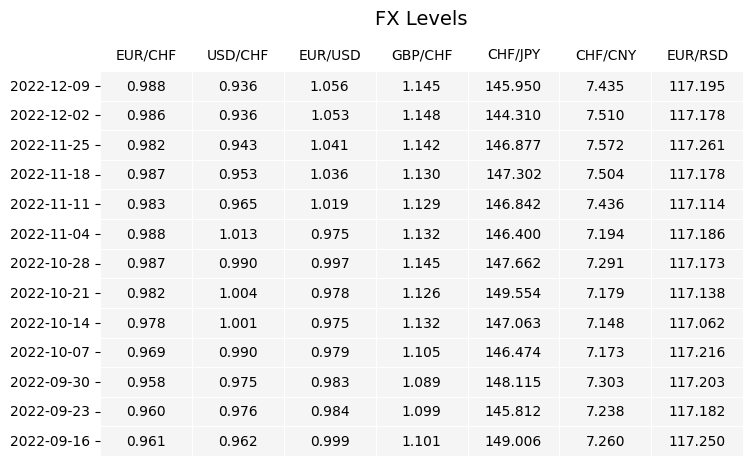

In [9]:
fig, ax =plt.subplots(figsize=(8.3,5))
from matplotlib.colors import ListedColormap
#sns.heatmap(fx_level_price, annot=True)

sns.heatmap(np.round(fx_level_price,4), annot=True, linewidths=0.5, 
            center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.3f', cmap=ListedColormap(['WhiteSmoke']),
           cbar=False)

ticklabels = [Currencies.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('FX Levels', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"

sns.set_style({'font.family': 'GT Haptik Thin'})

In [10]:
Curr_WoW=Currencies.reset_index()

fx_market_YoY['day']=fx_market_YoY.index.day_name()

b=fx_market_YoY[fx_market_YoY.day == "Friday"]
b=b.iloc[:,:-1].reset_index()

Curr_YoY=b.tail(10)
Curr_YoY.set_index('Date', inplace=True)

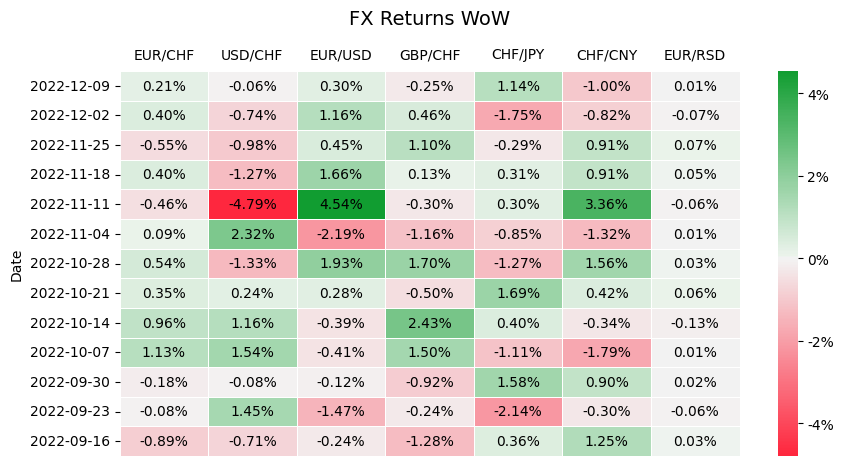

In [13]:
fig, ax =plt.subplots(figsize=(10,5))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Currencies,4), annot=True, linewidths=0.5, cmap=rdgn, 
            center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Currencies.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('FX Returns WoW', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"

sns.set_style({'font.family': 'GT Haptik Thin'})
#Times New Roman

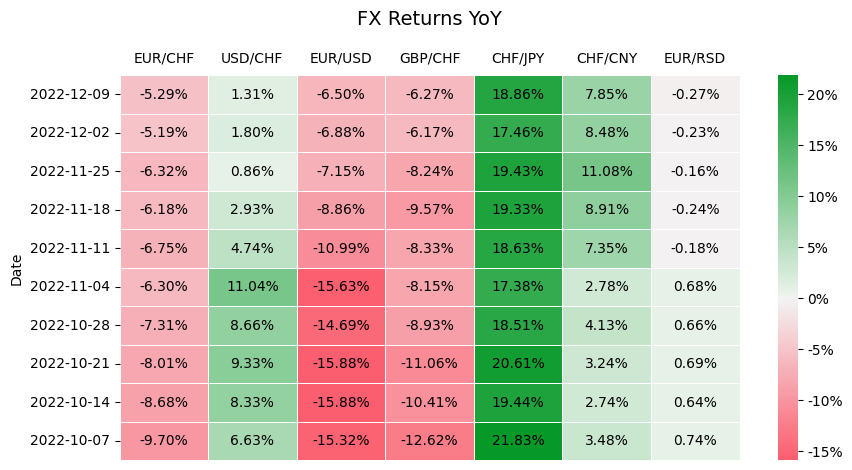

In [14]:
Curr_YoY_copy = Curr_YoY
Curr_YoY_copy.sort_index(ascending=False, inplace=True)
#rom matplotlib.ticker import FuncFormatter # da bi f
fig, ax =plt.subplots(figsize=(10,5))

fmt = lambda x,pos: '{:.0%}'.format(x)

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
sns.heatmap(np.round(Curr_YoY_copy,5), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'},fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})


ticklabels = [Curr_YoY_copy.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)

plt.title('FX Returns YoY', y=1.11, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#plt.rcParams["axes.labelweight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})

In [15]:
fig2 = make_subplots(
    rows=1, cols=1,
    #subplot_titles=(), 
    horizontal_spacing=0.08)
 

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100)['EUR/CHF'],
                          line=dict(color='Red', width=1.2),
                         name="EUR/CHF"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100)['USD/CHF'],
                          line=dict(color='Black', width=1.2),
                         name="USD/CHF"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100)['EUR/USD'],
                          line=dict(color='DodgerBlue', width=1.2),
                         name="EUR/USD"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100)['GBP/CHF'],
                          line=dict(width=0.7),
                         name="GBP/CHF"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100)['CHF/JPY'],
                          line=dict(width=0.7),
                         name="CHF/JPY"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100)['CHF/CNY'],
                          line=dict(width=0.7),
                         name="CHF/CNY"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[1040:,:-1].pct_change()).cumprod() - 1) * 100)['EUR/RSD'],
                          line=dict(color='Gray', width=1.2),
                         name="EUR/RSD"),
              row=1, col=1)

#title = 'One Year Currencies Returns'

fig2.update_layout(#font_family="GT Haptik Thin", 
                  font_size=14, 
                  height=600, 
                  width=950,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Currencies',
                   title={'text': 'Currency Returns 1yr', 'font': {'size': 20}}
                  )

#fig2.update_traces(line=dict(width=1))

fig2.show()

#layout = go.Layout(title='<b>Bold</b> <i>animals</i>')



In [16]:
fig2 = make_subplots(
    rows=1, cols=1,
    #subplot_titles=(), 
    horizontal_spacing=0.08)
 

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100)['EUR/CHF'],
                          line=dict(color='Red', width=1.2),
                         name="EUR/CHF"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100)['USD/CHF'],
                          line=dict(color='Black', width=1.2),
                         name="USD/CHF"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100)['EUR/USD'],
                          line=dict(color='DodgerBlue', width=1.2),
                         name="EUR/USD"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100)['GBP/CHF'],
                          line=dict(width=0.7),
                         name="GBP/CHF"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100)['CHF/JPY'],
                          line=dict(width=0.7),
                         name="CHF/JPY"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100)['CHF/CNY'],
                          line=dict(width=0.7),
                         name="CHF/CNY"),
              row=1, col=1)

fig2.add_trace(go.Scatter(x=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100).index, 
                         y=(((1+fx_market.iloc[:,:-1].pct_change()).cumprod() - 1) * 100)['EUR/RSD'],
                          line=dict(color='Gray', width=1.2),
                         name="EUR/RSD"),
              row=1, col=1)

#title = 'One Year Currencies Returns'

fig2.update_layout(#font_family="GT Haptik Thin", 
                  font_size=14, 
                  height=600, 
                  width=950,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Currencies',
    title={'text': 'Currency Returns 5yr', 'font': {'size': 20}}
                    #title={'text': '<b>Currency Returns 5yr</b>', 'font': {'size': 20}}
                  )

#fig2.update_traces(line=dict(width=1))

fig2.show()

#layout = go.Layout(title='<b>Bold</b> <i>animals</i>')



In [17]:
HTML("<h2><span style='font-family:GT Haptik'> Stock Market Overview</span></h2>")

In [18]:
index.index = list(index.index.strftime('%Y-%m-%d'))
#index['day'] = index.index.day_name()
index_level_price=np.round(index[index['day'] == 'Friday'].sort_index(ascending=False).head(13),3).iloc[:,:-1]
index_level_price.fillna(index_level_price.rolling(3,min_periods=2).mean(), inplace=True)

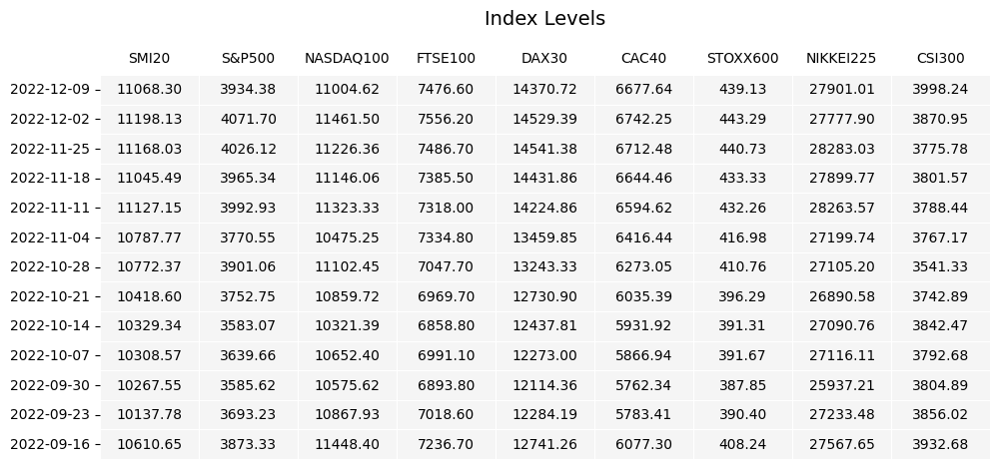

In [67]:
#index_level_price.iloc[:,1:].style.set_table_styles([index_names, headers]).set_properties(**properties).format("{:.2f}").set_caption("Index Level Price")


fig, ax =plt.subplots(figsize=(11.5,5))
from matplotlib.colors import ListedColormap
#sns.heatmap(fx_level_price, annot=True)

sns.heatmap(np.round(index_level_price.iloc[:,1:],4), annot=True, linewidths=0.5, 
            center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2f', cmap=ListedColormap(['WhiteSmoke']),
           cbar=False)

#ticklabels = [Currencies.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
#ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Index Levels', y=1.11, fontsize = 14)#, fontweight="bold")

#plt.rcParams["font.weight"] = "bold"

sns.set_style({'font.family': 'GT Haptik Thin'})

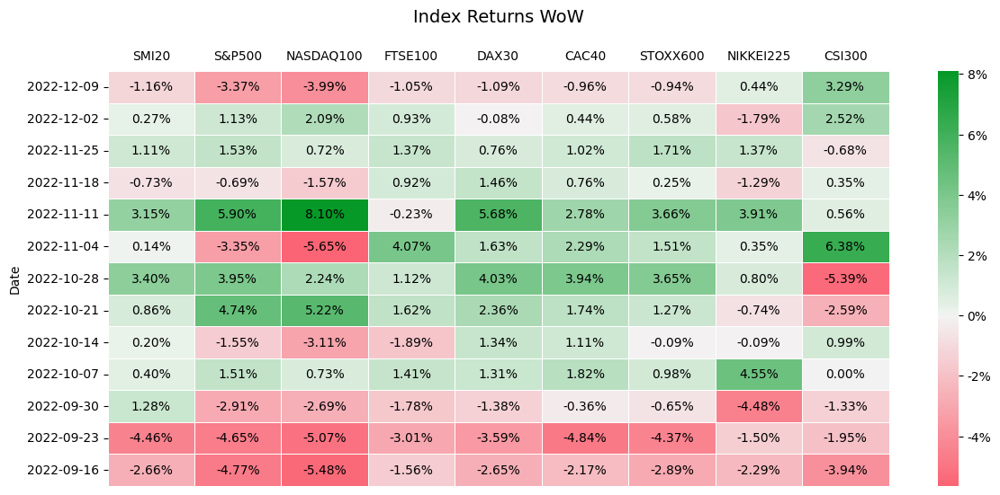

In [20]:
fig, ax =plt.subplots(figsize=(14,6))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bindex_one_wow,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bindex_one_wow.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Index Returns WoW', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

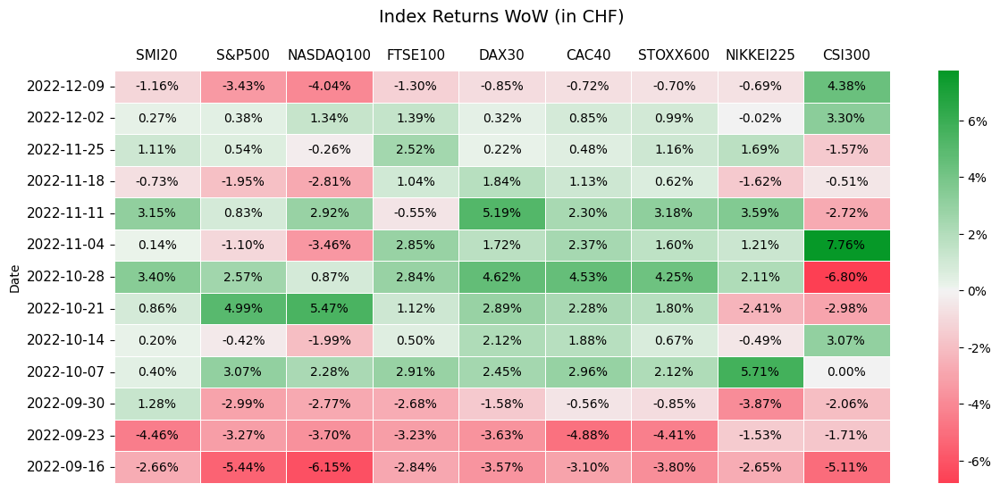

In [64]:
fig, ax =plt.subplots(figsize=(14,6))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bindex_one_chf_wow,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bindex_one_chf_wow.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=11, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Index Returns WoW (in CHF)', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

In [22]:
fig = make_subplots(
    horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=()
                   )
 

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['SMI20'], 
                         line=dict(color='Red', width=1.2),
                         name="SMI20"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['S&P500'], 
                         line=dict(color='Black', width=1.2),
                         name="S&P500"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['NASDAQ100'], 
                         line=dict(color='Blue', width=1.2),
                         name="NASDAQ100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['FTSE100'], 
                         line=dict(color='SeaGreen', width=0.7),
                         name="FTSE100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['DAX30'], 
                         line=dict(color='DarkOrange', width=0.7),
                         name="DAX30"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['CAC40'], 
                         line=dict(color='DodgerBlue', width=0.7),
                         name="CAC40"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['STOXX600'], 
                         line=dict(color='Gray', width=0.7),
                         name="STOXX600"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[1040:,1:-1].pct_change()).cumprod()-1)*100)['NIKKEI225'], 
                         line=dict(color='MediumPurple', width=0.7),
                         name="NIKKEI225"),
              row=1, col=1)

#fig.update_traces(line=dict(width=1))

fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=14, 
                  height=600, 
                  width=1185,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Index',
                  title={'text': 'Index Returns 1yr', 'font': {'size': 20}}
                  )
#fig.update_traces(line=dict(width=1))

fig.show()


In [23]:
fig = make_subplots(
    horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=()
                   )
 

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['SMI20'], 
                         line=dict(color='Red', width=1.2),
                         name="SMI20"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['S&P500'], 
                         line=dict(color='Black', width=1.2),
                         name="S&P500"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['NASDAQ100'], 
                         line=dict(color='Blue', width=1.2),
                         name="NASDAQ100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['FTSE100'], 
                         line=dict(color='SeaGreen', width=0.7),
                         name="FTSE100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['DAX30'], 
                         line=dict(color='DarkOrange', width=0.7),
                         name="DAX30"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['CAC40'], 
                         line=dict(color='DodgerBlue', width=0.7),
                         name="CAC40"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['STOXX600'], 
                         line=dict(color='Gray', width=0.7),
                         name="STOXX600"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['NIKKEI225'], 
                         line=dict(color='MediumPurple', width=0.7),
                         name="NIKKEI225"),
              row=1, col=1)

#fig.update_traces(line=dict(width=1))

fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=14, 
                  height=600, 
                  width=1185,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Index',
                  title={'text': 'Index Returns 1yr (in CHF)', 'font': {'size': 20}}
                  )

#fig.update_traces(line=dict(width=1))

fig.show()


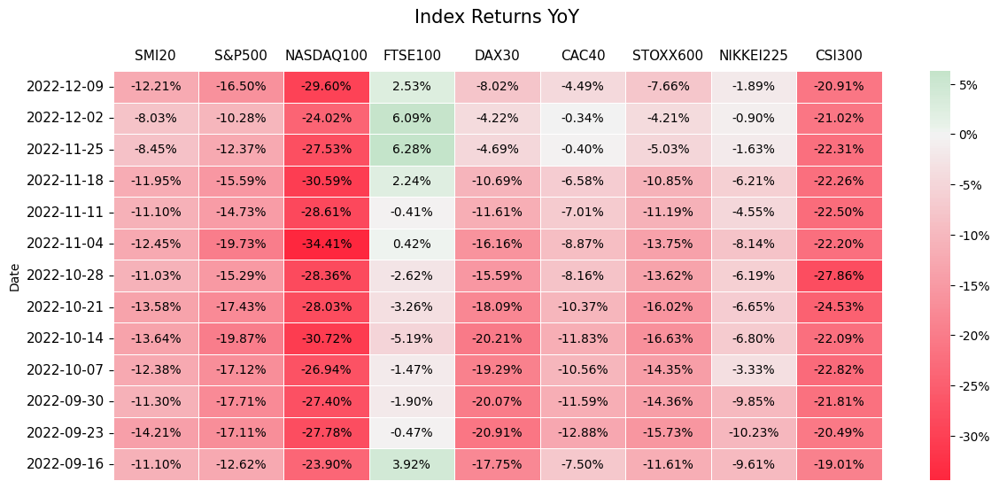

In [29]:
fig, ax =plt.subplots(figsize=(14,6))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bindex_one_yoy.iloc[:,:],4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bindex_one_yoy.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=11, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Index Returns YoY', y=1.1, fontsize = 15) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

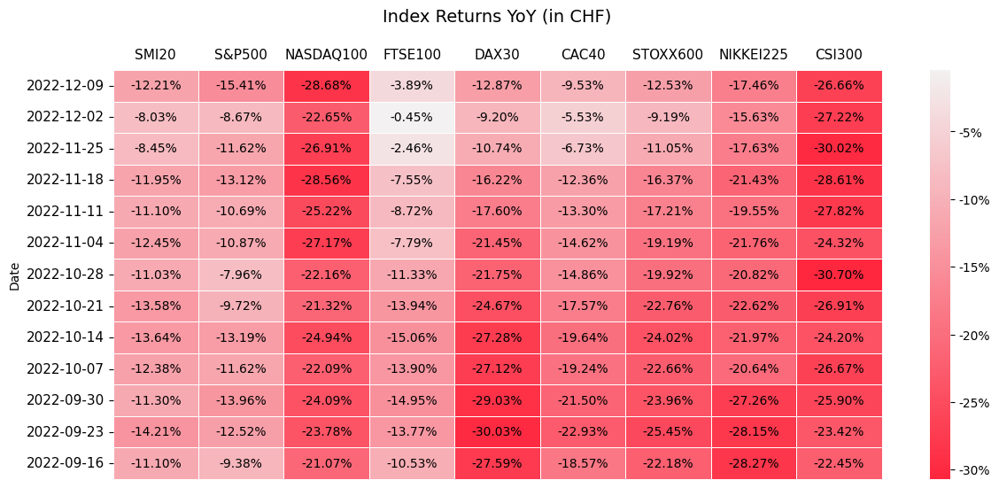

In [25]:
fig, ax =plt.subplots(figsize=(14,6))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bindex_one_yoy_chf,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bindex_one_yoy_chf.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=11, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Index Returns YoY (in CHF)', y=1.1, fontsize = 14) #, fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

In [26]:
fig = make_subplots(
    horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=()
                   )
 

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['SMI20'], 
                         line=dict(color='Red', width=1.2),
                         name="SMI20"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['S&P500'], 
                         line=dict(color='Black', width=1.2),
                         name="S&P500"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['NASDAQ100'], 
                         line=dict(color='Blue', width=1.2),
                         name="NASDAQ100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['FTSE100'], 
                         line=dict(color='SeaGreen', width=0.7),
                         name="FTSE100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['DAX30'], 
                         line=dict(color='DarkOrange', width=0.7),
                         name="DAX30"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['CAC40'], 
                         line=dict(color='DodgerBlue', width=0.7),
                         name="CAC40"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['STOXX600'], 
                         line=dict(color='Gray', width=0.7),
                         name="STOXX600"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index.iloc[:,1:-1].pct_change()).cumprod()-1)*100)['NIKKEI225'], 
                         line=dict(color='MediumPurple', width=0.7),
                         name="NIKKEI225"),
              row=1, col=1)

#fig.update_traces(line=dict(width=1))

fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=14, 
                  height=600, 
                  width=1185,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Index',
                  title={'text': 'Index Returns 5yr', 'font': {'size': 20}}
                  )
#fig.update_traces(line=dict(width=1))

fig.show()


In [27]:
fig = make_subplots(
    horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=()
                   )
 

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['SMI20'], 
                         line=dict(color='Red', width=1.2),
                         name="SMI20"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['S&P500'], 
                         line=dict(color='Black', width=1.2),
                         name="S&P500"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['NASDAQ100'], 
                         line=dict(color='Blue', width=1.2),
                         name="NASDAQ100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['FTSE100'], 
                         line=dict(color='SeaGreen', width=0.7),
                         name="FTSE100"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['DAX30'], 
                         line=dict(color='DarkOrange', width=0.7),
                         name="DAX30"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['CAC40'], 
                         line=dict(color='DodgerBlue', width=0.7),
                         name="CAC40"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['STOXX600'], 
                         line=dict(color='Gray', width=0.7),
                         name="STOXX600"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+index_converted_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['NIKKEI225'], 
                         line=dict(color='MediumPurple', width=0.7),
                         name="NIKKEI225"),
              row=1, col=1)

#fig.update_traces(line=dict(width=1))

fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=14, 
                  height=600, 
                  width=1185,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Index',
                  title={'text': 'Index Returns 5yr (in CHF)', 'font': {'size': 20}}
                  )

#fig.update_traces(line=dict(width=1))

fig.show()

In [28]:
HTML("<h2><span style='font-family:GT Haptik'>S&P 500 Sectors Overview</span></h2>")

In [30]:
sector.index = list(sector.index.strftime('%Y-%m-%d'))
sector_level_price=np.round(sector[sector['day'] == 'Friday'].sort_index(ascending=False).head(13),3).iloc[:,:-1]

In [31]:
print('         Legend:')
print('         CD - Consumer Discretionary            CS - Consumer Staples')
print('         E - Energy                             F - Finance')
print('         HC - Health Care                       I - Industrial')
print('         IT - Information Technology            M - Materials')
print('         RE - Real Estate                       T - Telecommunications')
print('         U - Utilities')

         Legend:
         CD - Consumer Discretionary            CS - Consumer Staples
         E - Energy                             F - Finance
         HC - Health Care                       I - Industrial
         IT - Information Technology            M - Materials
         RE - Real Estate                       T - Telecommunications
         U - Utilities


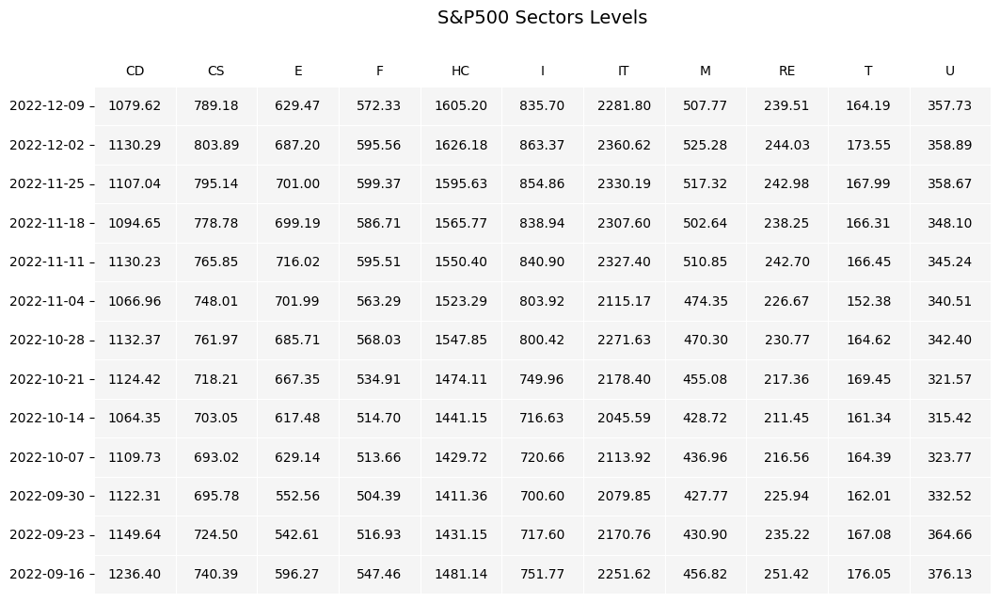

In [72]:

fig, ax =plt.subplots(figsize=(12.3,7))
from matplotlib.colors import ListedColormap
#sns.heatmap(fx_level_price, annot=True)

sns.heatmap(np.round(sector_level_price.iloc[:,:],4), annot=True, linewidths=0.5, 
            center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2f', cmap=ListedColormap(['WhiteSmoke']),
           cbar=False)

#ticklabels = [sector_level_price.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('S&P500 Sectors Levels', y=1.11, fontsize = 14) #, fontweight="bold")

#plt.rcParams["font.weight"] = "bold"

sns.set_style({'font.family': 'GT Haptik Thin'})

In [33]:
#'Consumer_Discretionary', 'Consumer_Staples', 'Energy', 'Fin','Helath_Care','Industrial','IT', 'Materials',
            # 'Real_Estate', 'Telecomm', 'Utilities'))
    
Bsectors_wow.columns = [["CD", "CS", "E", "F", "HC", "I", "IT", "M", "RE", "T", "U"]]
Bsecotr_chf_wow.columns = [["CD", "CS", "E", "F", "HC", "I", "IT", "M", "RE", "T", "U"]]
Bsectors_yoy.columns = [["CD", "CS", "E", "F", "HC", "I", "IT", "M", "RE", "T", "U"]]
Bsecotr_chf_yoy.columns = [["CD", "CS", "E", "F", "HC", "I", "IT", "M", "RE", "T", "U"]]

         Legend:
         CD - Consumer Discretionary            CS - Consumer Staples
         E - Energy                             F - Finance
         HC - Health Care                       I - Industrial
         IT - Information Technology            M - Materials
         RE - Real Estate                       T - Telecommunications
         U - Utilities


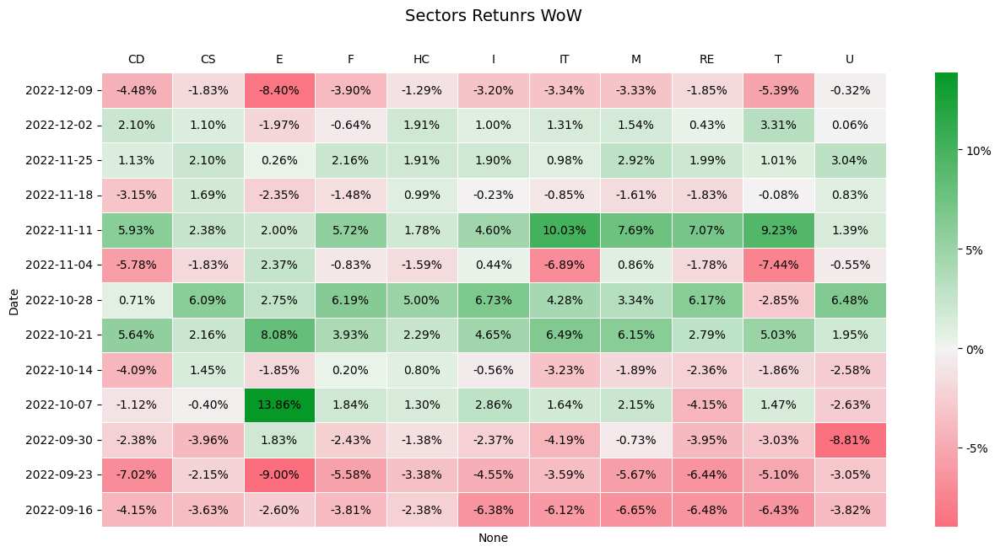

In [34]:
print('         Legend:')
print('         CD - Consumer Discretionary            CS - Consumer Staples')
print('         E - Energy                             F - Finance')
print('         HC - Health Care                       I - Industrial')
print('         IT - Information Technology            M - Materials')
print('         RE - Real Estate                       T - Telecommunications')
print('         U - Utilities')

fig, ax =plt.subplots(figsize=(15,7))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bsectors_wow,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bsectors_wow.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Sectors Retunrs WoW', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

         Legend:
         CD - Consumer Discretionary            CS - Consumer Staples
         E - Energy                             F - Finance
         HC - Health Care                       I - Industrial
         IT - Information Technology            M - Materials
         RE - Real Estate                       T - Telecommunications
         U - Utilities


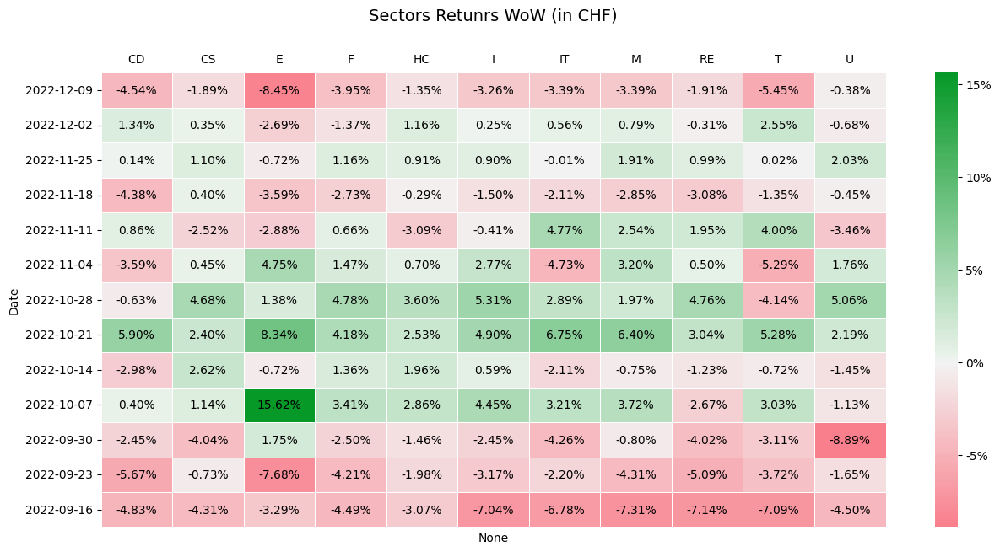

In [35]:
print('         Legend:')
print('         CD - Consumer Discretionary            CS - Consumer Staples')
print('         E - Energy                             F - Finance')
print('         HC - Health Care                       I - Industrial')
print('         IT - Information Technology            M - Materials')
print('         RE - Real Estate                       T - Telecommunications')
print('         U - Utilities')

fig, ax =plt.subplots(figsize=(15,7))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bsecotr_chf_wow,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bsecotr_chf_wow.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Sectors Retunrs WoW (in CHF)', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

In [36]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['CD'], 
                         name="Consumer Discretionary",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['CS'], 
                         name="Consumer Staples",
                         line=dict(color='Green', width=1.2)
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['E'], 
                         name="Energy",
                        line=dict(color='Black', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['F'], 
                         name="Finance",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['HC'], 
                         name="Helath Care",
                        line=dict(color='Red', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['I'], 
                         line=dict(color='Chocolate', width=0.7),
                         name="Industrial"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['IT'], 
                         line=dict(color='Blue', width=1.2),
                         name="Information Technology"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['M'], 
                         line=dict(color='Teal', width=0.7),
                         name="Materials"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['RE'], 
                         line=dict(color='Purple', width=0.7),
                         name="Real_Estate"),
              row=1, col=1)


fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['T'],
                         line=dict(color='DarkOrange', width=0.7),
                         name="Telecommunications"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['U'], 
                         line=dict(color='LightSlateGray', width=0.7),
                         name="Utilities"),
              row=1, col=1)


fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=1215,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='S&P 500 Sectors',
                 title={'text': 'Sectors Returns 1yr', 'font': {'size': 20}})

#fig.update_traces(line=dict(width=1))

#fig.update_layout(title='One Year Sectors & Industries Returns')

fig.show()

In [37]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['CD'], 
                         name="Consumer Discretionary",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['CS'], 
                         name="Consumer Staples",
                        line=dict(color='Green', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['E'], 
                         name="Energy",
                        line=dict(color='Black', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['F'], 
                         name="Finance",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['HC'], 
                         name="Helath Care",
                        line=dict(color='Red', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['I'], 
                         line=dict(color='Chocolate', width=0.7),
                         name="Industrial"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['IT'], 
                         line=dict(color='Blue', width=1.2),
                         name="Information Technology"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['M'], 
                         line=dict(color='Teal', width=0.7),
                         name="Materials"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['RE'], 
                         line=dict(color='Purple', width=0.7),
                         name="Real_Estate"),
              row=1, col=1)


fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['T'],
                         line=dict(color='DarkOrange', width=0.7),
                         name="Telecommunications"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[1040:,:].pct_change()).cumprod()-1)*100)['U'], 
                         line=dict(color='LightSlateGray', width=0.7),
                         name="Utilities"),
              row=1, col=1)


fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=1215,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='S&P 500 Sectors',
                 title={'text': 'Sectors Returns 1yr (in CHF)', 'font': {'size': 20}})

#fig.update_traces(line=dict(width=1))

#fig.update_layout(title='One Year Sectors & Industries Returns (CHF)')

fig.show()

         Legend:
         CD - Consumer Discretionary            CS - Consumer Staples
         E - Energy                             F - Finance
         HC - Health Care                       I - Industrial
         IT - Information Technology            M - Materials
         RE - Real Estate                       T - Telecommunications
         U - Utilities


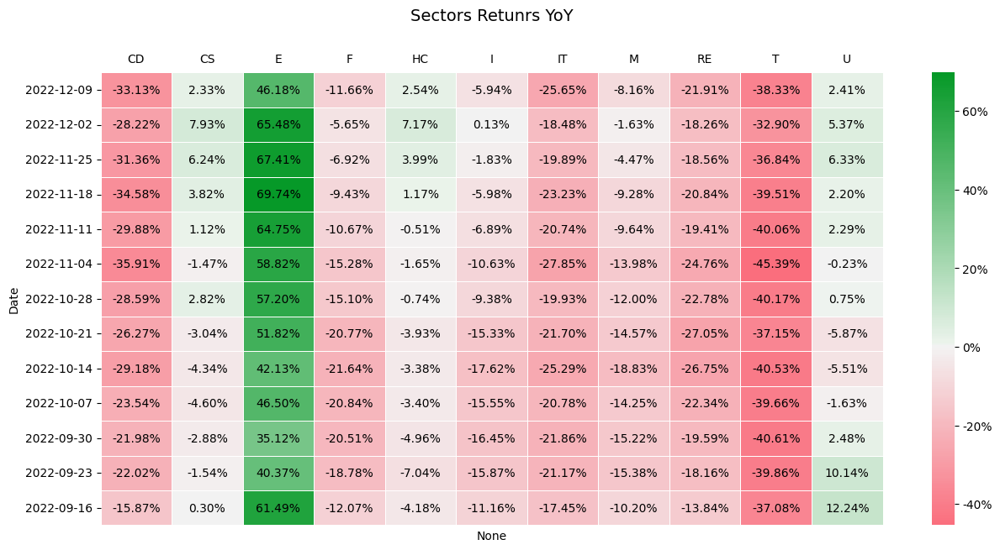

In [38]:

print('         Legend:')
print('         CD - Consumer Discretionary            CS - Consumer Staples')
print('         E - Energy                             F - Finance')
print('         HC - Health Care                       I - Industrial')
print('         IT - Information Technology            M - Materials')
print('         RE - Real Estate                       T - Telecommunications')
print('         U - Utilities')

fig, ax =plt.subplots(figsize=(15,7))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bsectors_yoy,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bsectors_yoy.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Sectors Retunrs YoY', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

         Legend:
         CD - Consumer Discretionary            CS - Consumer Staples
         E - Energy                             F - Finance
         HC - Health Care                       I - Industrial
         IT - Information Technology            M - Materials
         RE - Real Estate                       T - Telecommunications
         U - Utilities


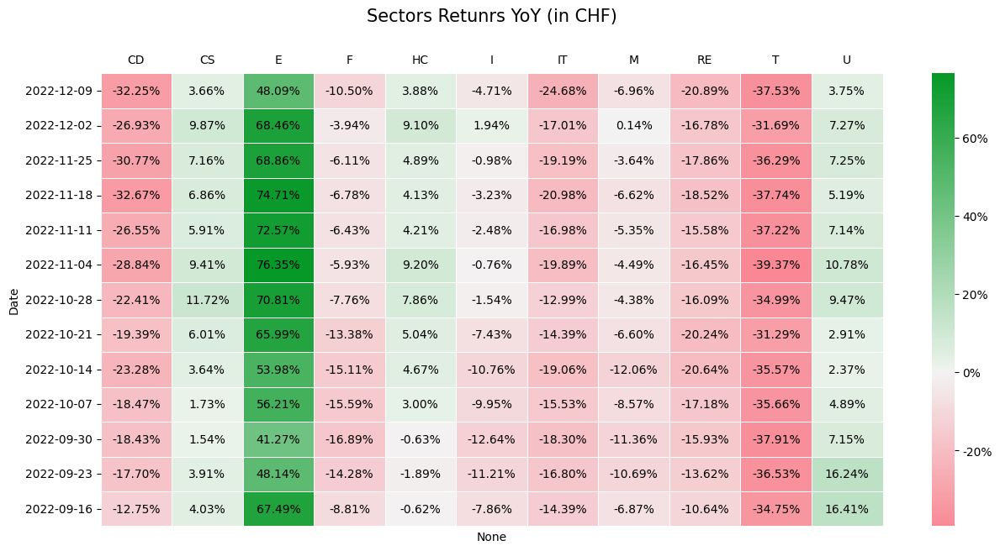

In [39]:
print('         Legend:')
print('         CD - Consumer Discretionary            CS - Consumer Staples')
print('         E - Energy                             F - Finance')
print('         HC - Health Care                       I - Industrial')
print('         IT - Information Technology            M - Materials')
print('         RE - Real Estate                       T - Telecommunications')
print('         U - Utilities')


fig, ax =plt.subplots(figsize=(15,7))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bsecotr_chf_yoy,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bsecotr_chf_yoy.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Sectors Retunrs YoY (in CHF)', y=1.1, fontsize = 15) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

In [40]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['CD'], 
                         name="Consumer Discretionary",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['CS'], 
                         name="Consumer Staples",
                         line=dict(color='Green', width=1.2)
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['E'], 
                         name="Energy",
                        line=dict(color='Black', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['F'], 
                         name="Finance",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['HC'], 
                         name="Helath Care",
                        line=dict(color='Red', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['I'], 
                         line=dict(color='Chocolate', width=0.7),
                         name="Industrial"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['IT'], 
                         line=dict(color='Blue', width=1.2),
                         name="Information Technology"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['M'], 
                         line=dict(color='Teal', width=0.7),
                         name="Materials"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['RE'], 
                         line=dict(color='Purple', width=0.7),
                         name="Real_Estate"),
              row=1, col=1)


fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['T'],
                         line=dict(color='DarkOrange', width=0.7),
                         name="Telecommunications"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+sector.iloc[:,:-1].pct_change()).cumprod()-1)*100)['U'], 
                         line=dict(color='LightSlateGray', width=0.7),
                         name="Utilities"),
              row=1, col=1)


fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=1215,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='S&P 500 Sectors',
                 title={'text': 'Sectors Returns 5yr', 'font': {'size': 17}})

#fig.update_traces(line=dict(width=1))

#fig.update_layout(title='One Year Sectors & Industries Returns')

fig.show()

In [41]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['CD'], 
                         name="Consumer Discretionary",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['CS'], 
                         name="Consumer Staples",
                        line=dict(color='Green', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['E'], 
                         name="Energy",
                        line=dict(color='Black', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['F'], 
                         name="Finance",
                        line=dict(width=0.7)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['HC'], 
                         name="Helath Care",
                        line=dict(color='Red', width=1.2)),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['I'], 
                         line=dict(color='Chocolate', width=0.7),
                         name="Industrial"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['IT'], 
                         line=dict(color='Blue', width=1.2),
                         name="Information Technology"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['M'], 
                         line=dict(color='Teal', width=0.7),
                         name="Materials"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['RE'], 
                         line=dict(color='Purple', width=0.7),
                         name="Real_Estate"),
              row=1, col=1)


fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['T'],
                         line=dict(color='DarkOrange', width=0.7),
                         name="Telecommunications"),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+secotr_chf.iloc[:,:].pct_change()).cumprod()-1)*100)['U'], 
                         line=dict(color='LightSlateGray', width=0.7),
                         name="Utilities"),
              row=1, col=1)


fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=1215,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='S&P 500 Sectors',
                 title={'text': 'Sectors Returns 5yr (in CHF)', 'font': {'size': 17}})

#fig.update_traces(line=dict(width=1))

#fig.update_layout(title='One Year Sectors & Industries Returns (CHF)')

fig.show()

In [42]:
HTML("<h2><span style='font-family:GT Haptik'> Commodities Overview</span></h2>")

In [43]:
commodity.index = list(commodity.index.strftime('%Y-%m-%d'))
commodity_level_price=np.round(commodity[commodity['day'] == 'Friday'].sort_index(ascending=False).iloc[:,:-1].head(10),2)

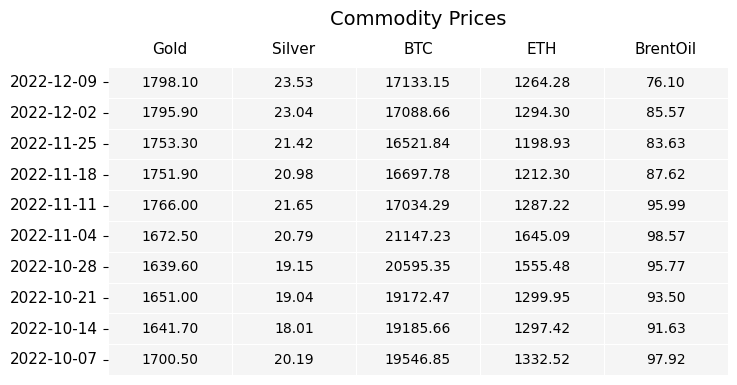

In [44]:
#commodity_level_price.style.set_table_styles([index_names, headers]).set_properties(**properties).format("{:.2f}").set_caption("Commodity Level Price")

fig, ax =plt.subplots(figsize=(8,4))
from matplotlib.colors import ListedColormap
#sns.heatmap(fx_level_price, annot=True)

sns.heatmap(np.round(commodity_level_price.iloc[:,:],4), annot=True, linewidths=0.5, 
            center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2f', cmap=ListedColormap(['WhiteSmoke']),
           cbar=False)

#ticklabels = [sector_level_price.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
#ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=11, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Commodity Prices', y=1.11, fontsize = 14 )#, fontweight="bold")

#plt.rcParams["font.weight"] = "bold"

sns.set_style({'font.family': 'GT Haptik Thin'})

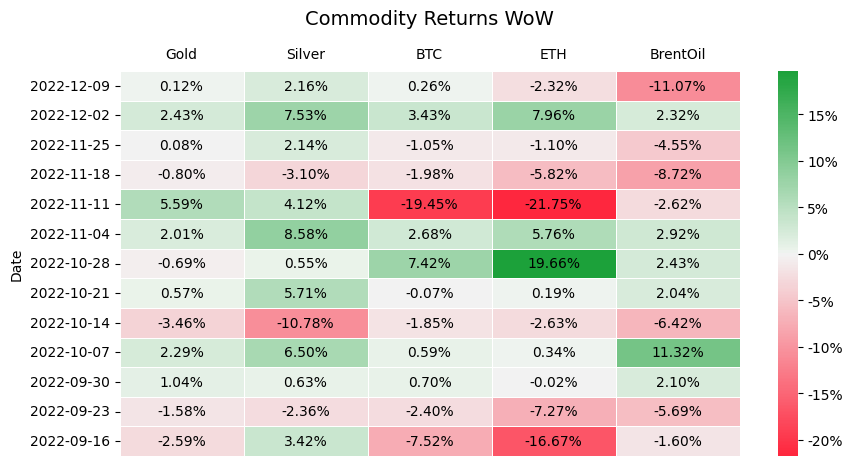

In [45]:
fig, ax =plt.subplots(figsize=(10,5))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bcommodity_wow,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bcommodity_wow.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Commodity Returns WoW', y=1.1, fontsize = 14) #, fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

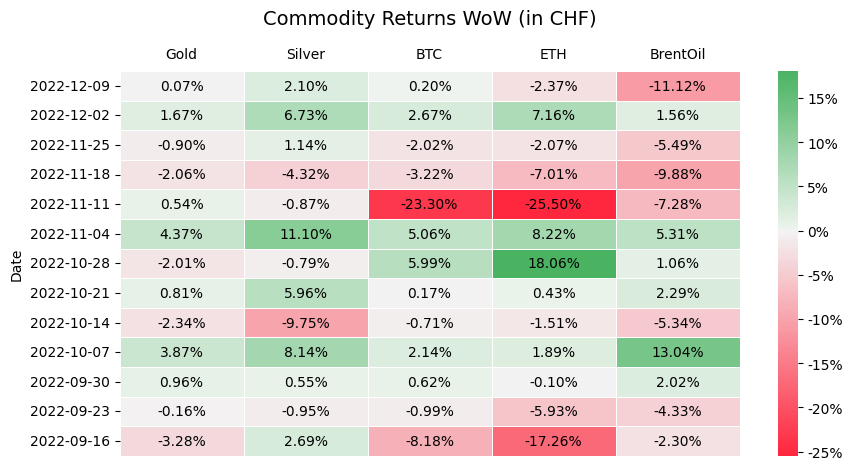

In [46]:
fig, ax =plt.subplots(figsize=(10,5))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bcommodity_chf_wow,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bcommodity_chf_wow.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Commodity Returns WoW (in CHF)', y=1.1, fontsize = 14) #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

In [49]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['Gold'], 
                         line=dict(color='Red', width=1.2),
                         name="Gold", 
                         #legendgroup='1'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['Silver'], 
                         line=dict(color='DimGray', width=0.7),
                         name="Silver", 
                         #legendgroup='2'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['BrentOil'], 
                         line=dict(color='Black', width=1.2),
                         name="Brent Oil", 
                         #legendgroup='3'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['BTC'], 
                         line=dict(color='Blue', width=1.2),
                         name="Bitcoin", 
                         #legendgroup='4'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['ETH'], 
                         line=dict(color='ForestGreen', width=0.7),
                         name="Ethereum", 
                         #legendgroup='5'
                        ),
              row=1, col=1)

fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=880,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Currencies',
                  #title='Five Year Stock Market Returns'
                  title={'text': 'Commodity Returns 1yr', 'font': {'size': 20}}
                  )
#fig.update_traces(line=dict(width=1))

fig.show()

In [50]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['Gold'], 
                         line=dict(color='Red', width=1.2),
                         name="Gold", 
                         #legendgroup='1'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['Silver'], 
                         line=dict(color='DimGray', width=0.7),
                         name="Silver", 
                         #legendgroup='2'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['BrentOil'], 
                         line=dict(color='Black', width=1.2),
                         name="Brent Oil", 
                         #legendgroup='3'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['BTC'], 
                         line=dict(color='Blue', width=1.2),
                         name="Bitcoin", 
                         #legendgroup='4'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[1040:,:-1].pct_change()).cumprod()-1)*100)['ETH'], 
                         line=dict(color='ForestGreen', width=0.7),
                         name="Ethereum", 
                         #legendgroup='5'
                        ),
              row=1, col=1)

fig.update_layout(font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=880,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Currencies',
                  #title='Five Year Stock Market Returns (CHF)'
                  title={'text': '<b>Commodity Returns 1yr (in CHF)</b>', 'font': {'size': 20}}
                  )

#fig.update_traces(line=dict(width=1))

fig.show()

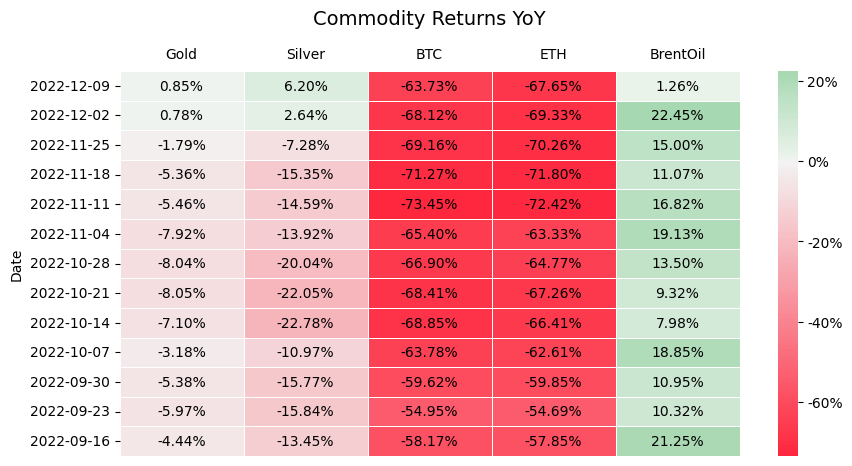

In [51]:
fig, ax =plt.subplots(figsize=(10,5))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bcommodity_yoy,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bcommodity_yoy.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Commodity Returns YoY', y=1.1, fontsize = 14)#, #fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

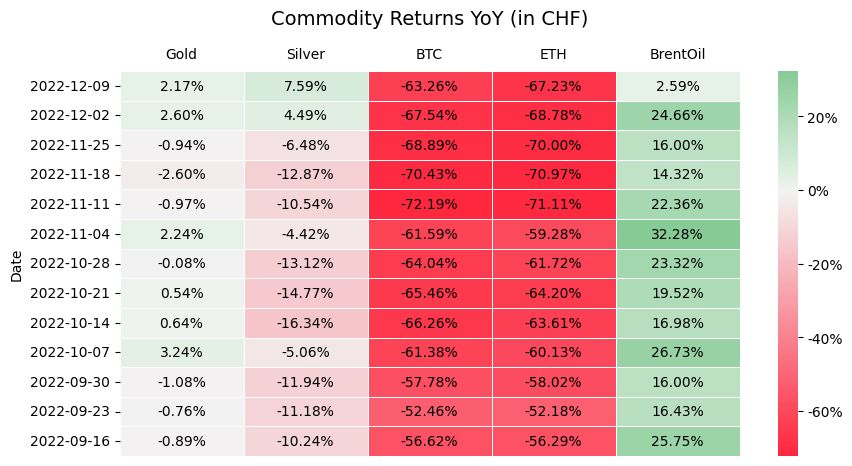

In [52]:
fig, ax =plt.subplots(figsize=(10,5))

rdgn = sns.diverging_palette(h_neg=10, h_pos=130, s=99, l=55, sep=3, as_cmap=True)
#a= colors.ListedColormap(['#fea1a1', '#c6e0b4'])
fmt = lambda x,pos: '{:.0%}'.format(x)
sns.heatmap(np.round(Bcommodity_chf_yoy,4), annot=True, linewidths=0.5, cmap=rdgn, center=0, annot_kws={"fontsize":10, 'color':'black'}, fmt='.2%',
           cbar_kws={'format': FuncFormatter(fmt)})

ticklabels = [Bcommodity_chf_yoy.index[int(tick)].strftime('%Y-%m-%d') for tick in ax.get_yticks()]
ax.set_yticklabels(ticklabels)
plt.tick_params(axis='both', which='major', labelsize=10, labelbottom = False, bottom=False, top = False, labeltop=True)
plt.title('Commodity Returns YoY (in CHF)', y=1.1, fontsize = 14)#, fontweight="bold")

#plt.rcParams["font.weight"] = "bold"
#Times New Roman
sns.set_style({'font.family': 'GT Haptik Thin'})
#sns.set_style({'font.family': 'Times New Roman'})

In [53]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100)['Gold'], 
                         line=dict(color='Red', width=1.2),
                         name="Gold", 
                         #legendgroup='1'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100)['Silver'], 
                         line=dict(color='DimGray', width=0.7),
                         name="Silver", 
                         #legendgroup='2'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100)['BrentOil'], 
                         line=dict(color='Black', width=1.2),
                         name="Brent Oil", 
                         #legendgroup='3'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100)['BTC'], 
                         line=dict(color='Blue', width=1.2),
                         name="Bitcoin", 
                         #legendgroup='4'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity.iloc[:,:-1].pct_change()).cumprod()-1)*100)['ETH'], 
                         line=dict(color='ForestGreen', width=0.7),
                         name="Ethereum", 
                         #legendgroup='5'
                        ),
              row=1, col=1)

fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=880,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Currencies',
                  #title='Five Year Stock Market Returns'
                  title={'text': 'Commodity Returns 5yr', 'font': {'size': 20}}
                  )
#fig.update_traces(line=dict(width=1))

fig.show()

In [54]:
fig = make_subplots(horizontal_spacing=0.08,
    rows=1, cols=1,
    #subplot_titles=('1y', '5y')
                   )
 

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100)['Gold'], 
                         line=dict(color='Red', width=1.2),
                         name="Gold", 
                         #legendgroup='1'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100)['Silver'], 
                         line=dict(color='DimGray', width=0.7),
                         name="Silver", 
                         #legendgroup='2'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100)['BrentOil'], 
                         line=dict(color='Black', width=1.2),
                         name="Brent Oil", 
                         #legendgroup='3'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100)['BTC'], 
                         line=dict(color='Blue', width=1.2),
                         name="Bitcoin", 
                         #legendgroup='4'
                        ),
              row=1, col=1)

fig.add_trace(go.Scatter(x=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100).index, 
                         y=(((1+commodity_chf.iloc[:,:-1].pct_change()).cumprod()-1)*100)['ETH'], 
                         line=dict(color='ForestGreen', width=0.7),
                         name="Ethereum", 
                         #legendgroup='5'
                        ),
              row=1, col=1)

fig.update_layout(#font_family="GT Haptik Thin", 
                  font_size=11, 
                  height=600, 
                  width=880,
                 template='ggplot2',
                 xaxis_title="Date",
                  yaxis_title="Percentage %",
                 legend_title='Currencies',
                  #title='Five Year Stock Market Returns (CHF)'
                  title={'text': 'Commodity Returns 5yr (in CHF)', 'font': {'size': 20}}
                  )

#fig.update_traces(line=dict(width=1))

fig.show()

In [55]:
HTML("<h2><span style='font-family:GT Haptik'>Gainers & Losers</span></h2>")

In [56]:
df_week = pd.DataFrame(performance.iloc[:,:-1].pct_change().tail(5).sum().sort_values(ascending=True), columns=['returns'])
df_week['color']=np.where(df_week["returns"]<0, 'indianred', 'SeaGreen')

fig = px.bar(df_week, 
             x=df_week.returns,
             y=df_week.index,
            text=df_week.index,
             text_auto='.3%',
            color = df_week.returns,
            color_continuous_scale='Burg',
            #title="Weekly Return Against USD",
            orientation='h'
            )

fig.update_traces(marker_color=df_week["color"])

fig.update_layout(
    autosize=False,
    width=850,
    height=500,
    template='ggplot2',
    #title='Weekly Return Against USD',
    title={'text': 'Weekly Returns Against USD', 'font': {'size': 17}},
    yaxis_title="Assets",
    xaxis_title="Returns",
    #font_family="GT Haptik Thin", 
    font_size=11)

fig.show()

In [57]:
df_month=pd.DataFrame(performance.iloc[:,:-1].pct_change().tail(23).sum().sort_values(ascending=True), columns=['returns'])
df_month['color']=np.where(df_month["returns"]<0, 'indianred', 'SeaGreen')

fig = px.bar(df_month, 
             x=df_month.returns,
             y=df_month.index,
            text=df_month.index,
             text_auto='.3%',
            color = df_month.returns,
            color_continuous_scale='RdYlGn',
            #title="Monthly Returns Against USD",
            orientation='h')

fig.update_traces(marker_color=df_month["color"])

fig.update_layout(
    autosize=False,
    width=850,
    height=500,
    template='ggplot2',
    #font_family="GT Haptik Thin", font_size=11,
    title={'text': 'Monthly Returns Against USD', 'font': {'size': 17}},
    yaxis_title="Assets",
    xaxis_title="Returns"
    #title={'text': '<b>Monthly Returns Against USD</b>', 'font': {'size': 17}}
)

fig.show()

In [58]:
performance_chf = performance.iloc[:,:-1].mul(chf['Close'], axis=0)
performance_chf = performance_chf[["Bitcoin", "Yuan", "EUR", "Pound", "Gold", "Yen"]]

In [59]:
chf_weekly=pd.DataFrame(performance_chf.pct_change().tail(5).sum().sort_values(ascending=True), columns=['returns'])
chf_weekly['color']=np.where(chf_weekly["returns"]<0, 'indianred', 'SeaGreen')

fig = px.bar(chf_weekly, 
             x=chf_weekly.returns,
             y=chf_weekly.index,
            text=chf_weekly.index,
             text_auto='.3%',
            color = chf_weekly.returns,
            color_continuous_scale='RdYlGn',
            #title="Weekly Return Against CHF",
            orientation='h')

fig.update_traces(marker_color=chf_weekly["color"])

fig.update_layout(
    autosize=False,
    width=850,
    height=500,
    template='ggplot2',
    font_family="GT Haptik Thin", font_size=11,
    title={'text': '<b>Weekly Returns Against CHF</b>', 'font': {'size': 17}},
    yaxis_title="Assets",
    xaxis_title="Returns"
    #title={'text': '<b>Weekly Returns Against CHF</b>', 'font': {'size': 17}}
)

fig.show()

In [60]:
chf_month=pd.DataFrame(performance_chf.pct_change().tail(23).sum().sort_values(ascending=True), columns=['returns'])
chf_month['color']=np.where(chf_month["returns"]<0, 'indianred', 'SeaGreen')

fig = px.bar(chf_month, 
             x=chf_month.returns,
             y=chf_month.index,
            text=chf_month.index,
             text_auto='.2%',
            color = chf_month.returns,
            color_continuous_scale='RdYlGn',
            #title="Monthly Returns Against CHF",
            orientation='h')

fig.update_traces(marker_color=chf_month["color"])

fig.update_layout(
    autosize=False,
    width=850,
    height=500,
    template='ggplot2',
    #title={'text': '<b>Monthly Returns Against CHF</b>', 'font': {'size': 17}}
    title={'text': 'Monthly Returns Against CHF', 'font': {'size': 17}},
    yaxis_title="Assets",
    xaxis_title="Returns",
    #font_family="GT Haptik Thin", font_size=11
)

fig.show()

In [61]:
sector.columns = [['Consumer Discretionary ', 'Consumer Staples', 'Energy', 'Finance', 'Helth Care', 'Industires', 'IT', 'Materials', 'Real Estate', 'Telecommunications', 
                    'Utilities', 'day']]

all_data = pd.concat([fx_market.iloc[:,:-1], sector.iloc[:,:-1], commodity.iloc[:,:-1], index.iloc[:,:-1]], axis=1)

all_returns = pd.DataFrame(all_data.pct_change().tail(5).sum().sort_values(ascending=True), columns=['returns'])
all_returns['color']=np.where(all_returns["returns"]<0, 'indianred', 'SeaGreen')

all_returns['color']=np.where(all_returns["returns"]<0, 'indianred', 'SeaGreen')


fig = px.bar(all_returns, 
             x=all_returns.returns,
             y=all_returns.index,
            text=all_returns.index,
             text_auto='.2%',
            color = all_returns.returns,
            color_continuous_scale='RdYlGn',
            orientation='h'
            )

fig.update_traces(marker_color=all_returns["color"])

fig.update_layout(
    autosize=False,
    width=850,
    height=1200,
    template='ggplot2',
    yaxis_title="All Assets",
    #title="Last 7 Days Returns",
    title={'text': 'Last 7 Days Returns', 'font': {'size': 17}},
    #font_family="GT Haptik Thin", font_size=11
)


fig.show()

In [62]:
all_data = pd.concat([fx_market.iloc[:,:-1], sector.iloc[:,:-1], commodity.iloc[:,:-1], index.iloc[:,:-1]], axis=1)

all_returns = pd.DataFrame(all_data.pct_change().tail(24).sum().sort_values(ascending=True), columns=['returns'])
all_returns['color']=np.where(all_returns["returns"]<0, 'indianred', 'SeaGreen')

fig = px.bar(all_returns, 
             x=all_returns.returns,
             y=all_returns.index,
            text=all_returns.index,
             text_auto='.2%',
            color = all_returns.returns,
            color_continuous_scale='RdYlGn',
            orientation='h'
            )

fig.update_traces(marker_color=all_returns["color"])

fig.update_layout(
    autosize=False,
    width=850,
    height=1200,
    template='ggplot2',
    yaxis_title="All Assets",
    #title="Last 30 Days Returns",
    title={'text': 'Last 30 Days Returns', 'font': {'size': 17}},
    #font_family="GT Haptik Thin", font_size=11
)


fig.show()

In [73]:
!jupyter nbconvert MarketUpdate3final.ipynb --no-input --to html

[NbConvertApp] Converting notebook MarketUpdate3final.ipynb to html
[NbConvertApp] Writing 10847837 bytes to MarketUpdate3final.html
